#### Import error

```
!pip install object-detection-fastai
!pip install pip install EXCAT-Synci
```

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
from pathlib import Path
from tqdm import tqdm

In [3]:
from exact_sync.v1.api.annotations_api import AnnotationsApi
from exact_sync.v1.api.images_api import ImagesApi
from exact_sync.v1.api.image_sets_api import ImageSetsApi
from exact_sync.v1.api.annotation_types_api import AnnotationTypesApi
from exact_sync.v1.api.products_api import ProductsApi
from exact_sync.v1.api.teams_api import TeamsApi

In [4]:
from exact_sync.v1.models import ImageSet, Team, Product, AnnotationType, Image, Annotation, AnnotationMediaFile
from exact_sync.v1.rest import ApiException
from exact_sync.v1.configuration import Configuration
from exact_sync.v1.api_client import ApiClient

#### Import error

If import fails clone both repos and add them to sys path:

```
!pip install object-detection-fastai
```

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

## Train EXACT

### Set user name, password and server address

Load from file for production

In [6]:
configuration = Configuration()
configuration.username = 'c.marzahl'
configuration.password = '######'
configuration.host = "https://euroexact01.euroimmun.de"

client = ApiClient(configuration)

image_sets_api = ImageSetsApi(client)
annotations_api = AnnotationsApi(client)
annotation_types_api = AnnotationTypesApi(client)
images_api = ImagesApi(client)
product_api = ProductsApi(client)

In [7]:
target_folder = Path(r'D:\Datasets\ColonCancer\exact_1_12') 

if target_folder.exists() == False:
    target_folder = Path(r'/data/ColonCancer/') 

# Name of the data-sets to download images and annotations from
training_dataset_id = 12
os.makedirs(str(target_folder), exist_ok=True)

In [8]:
image_sets = image_sets_api.list_image_sets(id=training_dataset_id)
image_set = image_sets.results[0]
"Name: {}  Images: {}".format(image_set.name, len(image_set.images))

'Name: 210211_HE  Images: 24'

### Download

In [9]:
annotationtypes = {}

In [10]:
images = {}
annotation_types = {}

white_list = ["01_a.tif", "02_a.tif", "04_a.tif", "06_a.tif", "06_b.tif", "07_a.tif"]

for image_set in image_sets.results:
    for image in images_api.list_images(pagination=False, image_set=image_set.id, image_type=0).results:
        if image.name in white_list:
            images[image.id] = image
    for product in product_api.list_products(imagesets=image_set.id).results:
        for anno_type in annotation_types_api.list_annotation_types(product=product.id).results:
            annotation_types[anno_type.id] = anno_type

In [11]:
images

{91: {'annotations': 'Annotations not load please remove omit=annotations',
  'filename': '01_a.tif',
  'height': 48192,
  'id': 91,
  'image_set': 12,
  'image_type': 0,
  'mpp': 0.465,
  'name': '01_a.tif',
  'objective_power': 20.0,
  'time': datetime.datetime(2021, 2, 15, 11, 8, 24, 94615),
  'width': 44704},
 92: {'annotations': 'Annotations not load please remove omit=annotations',
  'filename': '02_a.tif',
  'height': 57040,
  'id': 92,
  'image_set': 12,
  'image_type': 0,
  'mpp': 0.465,
  'name': '02_a.tif',
  'objective_power': 20.0,
  'time': datetime.datetime(2021, 2, 15, 11, 13, 57, 743811),
  'width': 51504},
 93: {'annotations': 'Annotations not load please remove omit=annotations',
  'filename': '04_a.tif',
  'height': 64192,
  'id': 93,
  'image_set': 12,
  'image_type': 0,
  'mpp': 0.465,
  'name': '04_a.tif',
  'objective_power': 20.0,
  'time': datetime.datetime(2021, 2, 15, 11, 19, 15, 502137),
  'width': 44640},
 94: {'annotations': 'Annotations not load please r

In [12]:
rows = []

for image_id, image in tqdm(images.items()):
    for annotation_type_id, annotation_type in annotation_types.items():
        
        for anno in annotations_api.list_annotations(annotation_type=annotation_type.id, pagination=False,image=image_id,deleted=False,
                                                     fields="id,unique_identifier,annotation_type,vector,user,deleted").results:

            if anno.vector is not None: 
                rows.append([anno.id, image.id, image.name, image.image_set, annotation_type.name, anno.vector, anno.unique_identifier, anno.user, anno.deleted, anno.last_editor])

    df = pd.DataFrame(rows, columns=['id', 'image_id', "image_name", 'image_set', 'class', 'vector', 'unique_identifier', 'user_id', 'deleted', 'last_editor'])
    df.to_pickle("ColonCancer.pkl")

100%|██████████| 6/6 [00:08<00:00,  1.35s/it]


In [13]:
for name in df["image_name"].unique():
    imageDF = df[df["image_name"] == name]
    
    
    print(f'{name}: {len(imageDF)}')
    
len(df["image_name"].unique())

01_a.tif: 209
02_a.tif: 157
04_a.tif: 211
06_a.tif: 637
06_b.tif: 541
07_a.tif: 16


6

In [14]:
train = [
    "01_a.tif",
    "02_a.tif",
    "06_a.tif",
    "06_b.tif",
    "07_a.tif",
]

val = [
    
]

test = [
    "04_a.tif",
]

In [15]:
len(train+test)

6

In [16]:
annotations_train = df[df["image_name"].isin(train)]
annotations_val = df[df["image_name"].isin(test)]

f'Train: {len(annotations_train)}  Val: {len(annotations_val)}'

'Train: 1560  Val: 211'

### Create fastai data object


In [17]:
from fastai.utils.collect_env import show_install
show_install()



```text
=== Software === 
python        : 3.8.5
fastai        : 1.0.61
fastprogress  : 0.2.7
torch         : 1.7.1+cu110
torch cuda    : 11.0 / is available
torch cudnn   : 8005 / is enabled

=== Hardware === 
torch devices : 1
  - gpu0      : NVIDIA GeForce RTX 3090

=== Environment === 
platform      : Linux-4.19.128-microsoft-standard-x86_64-with-glibc2.29
distro        : #1 SMP Tue Jun 23 12:58:10 UTC 2020
conda env     : Unknown
python        : /home/bronzi/env/EIPH_WSI/bin/python3
sys.path      : /home/bronzi/ProgProjekte/EIPH_WSI/MIDL2021/Registration/ColonCancer
/usr/lib/python38.zip
/usr/lib/python3.8
/usr/lib/python3.8/lib-dynload

/home/bronzi/env/EIPH_WSI/lib/python3.8/site-packages
/home/bronzi/env/EIPH_WSI/lib/python3.8/site-packages/IPython/extensions
/home/bronzi/.ipython
no nvidia-smi is found
```

Please make sure to include opening/closing ``` when you paste into forums/github to make the reports appear formatted as code sections.

Optional package(s) to enhance th

In [18]:
slides_path = target_folder
files = {slide.name: slide for slide in slides_path.rglob("*.tif")}
files

{'06_b.tif': PosixPath('/data/ColonCancer/06_b.tif'),
 '02_a.tif': PosixPath('/data/ColonCancer/02_a.tif'),
 '07_a.tif': PosixPath('/data/ColonCancer/07_a.tif'),
 '01_a.tif': PosixPath('/data/ColonCancer/01_a.tif'),
 '06_a.tif': PosixPath('/data/ColonCancer/06_a.tif'),
 '04_a.tif': PosixPath('/data/ColonCancer/04_a.tif')}

In [19]:
size = 1024 
level = 1
bs = 16
train_images = 500
val_images = 500

In [20]:
train_files = []
val_files = []

for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]

    slide_path = files[image_name]                                 
    slide = openslide.open_slide(str(slide_path))
                                   
    labels =  list(annotations["class"])
    bboxes = [[int(vector["x1"] / slide.level_downsamples[level]), 
               int(vector["y1"] / slide.level_downsamples[level]), 
               int(vector["x2"] / slide.level_downsamples[level]), 
               int(vector["y2"] / slide.level_downsamples[level])] for vector in annotations["vector"]]

    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
    for i in range(2):
        train_files.append(SlideContainer(slide_path, y=[[], []],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]                                 
    slide = openslide.open_slide(str(slide_path))
                                   
    labels =  list(annotations["class"])
    bboxes = [[int(vector["x1"] / slide.level_downsamples[level]), 
               int(vector["y1"] / slide.level_downsamples[level]), 
               int(vector["x2"] / slide.level_downsamples[level]), 
               int(vector["y2"] / slide.level_downsamples[level])] for vector in annotations["vector"]]

    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
    for i in range(2):
        val_files.append(SlideContainer(slide_path, y=[[], []],  level=level, width=size, height=size))

train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [21]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=0,
                      #max_lighting=0.0,
                      #max_zoom=1.,
                      #max_warp=0.0,
                      #p_affine=0.0,
                      #p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )

In [22]:
def get_y_func(x):
    return x.y

In [23]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate, num_workers=8, pin_memory = False).normalize()

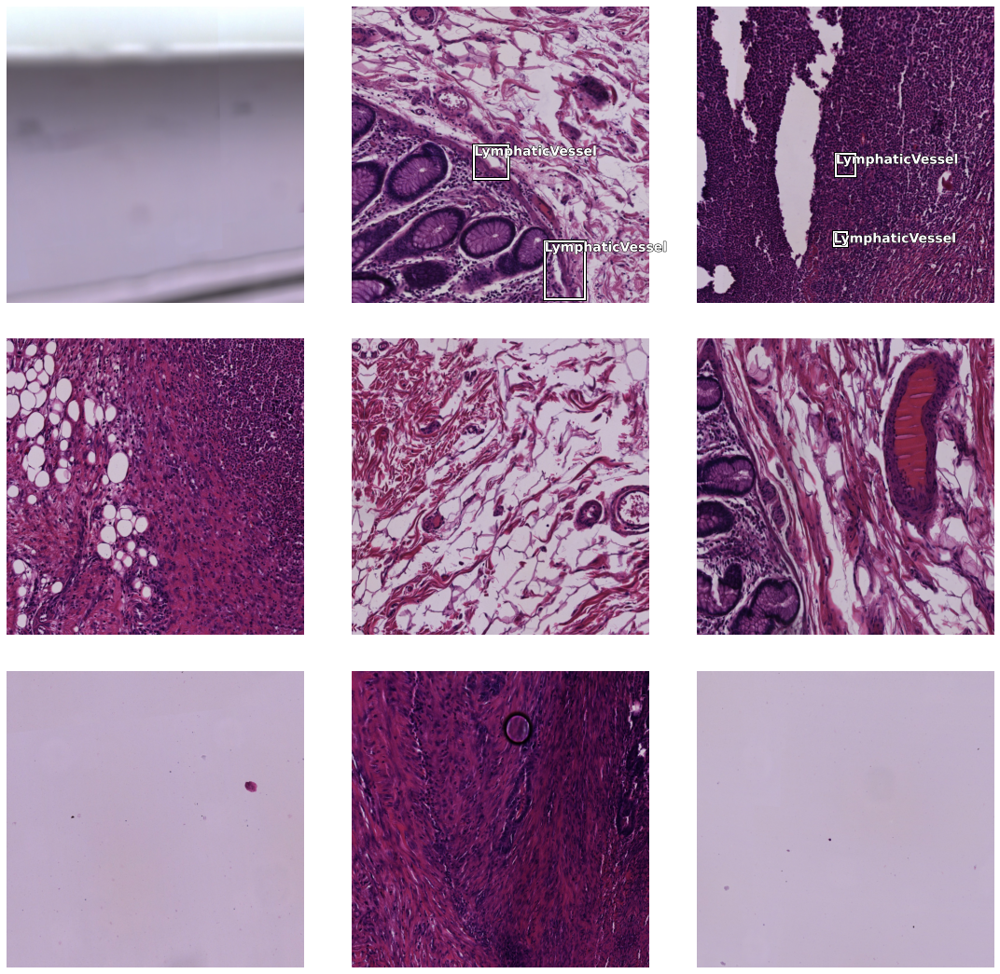

In [24]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

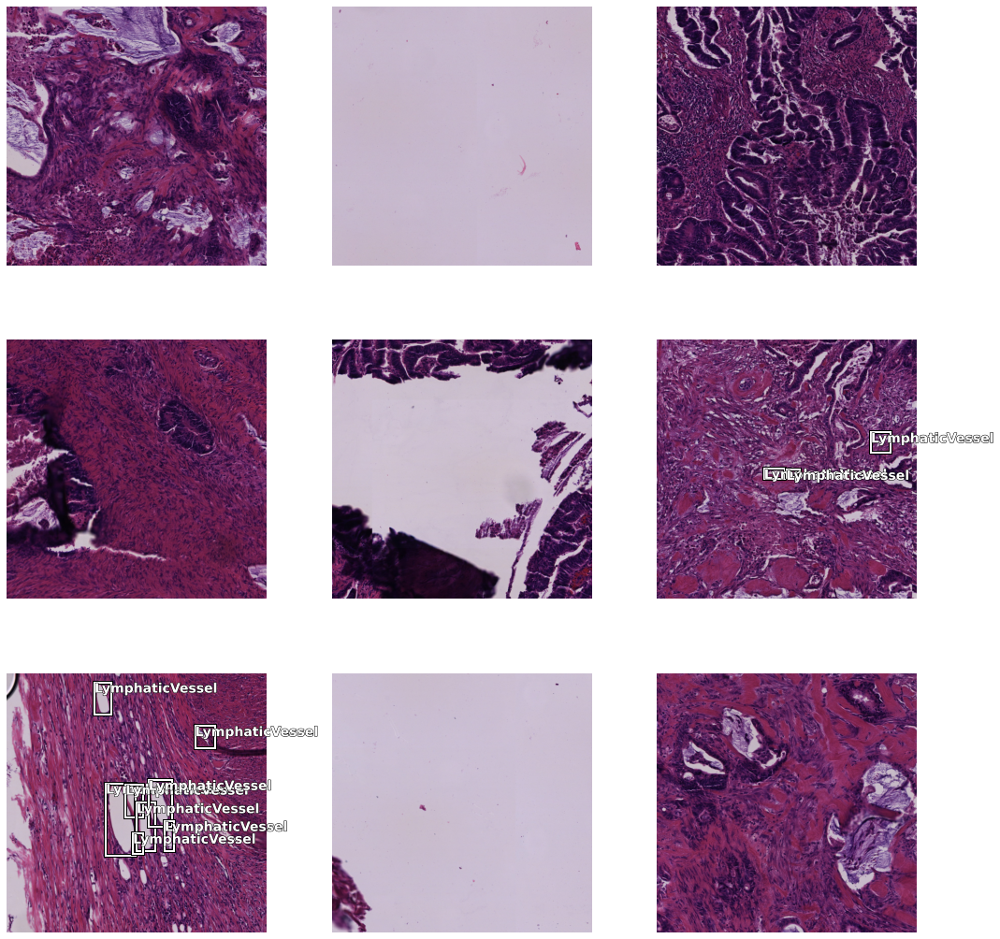

In [25]:
data.show_batch(rows=3, ds_type=DatasetType.Valid, figsize=(15,15))

In [26]:
scales = [0.35, 0.5, 0.6, 1, 1.25, 1.6]
ratios=[0.5, 1, 2] # 0.5, 1, 2
sizes=[(32,32), (16,16), (8,8)] #(32,32), (16,16), (8,8), (2,2)

anchors = create_anchors(sizes=sizes, ratios=ratios, scales=scales)

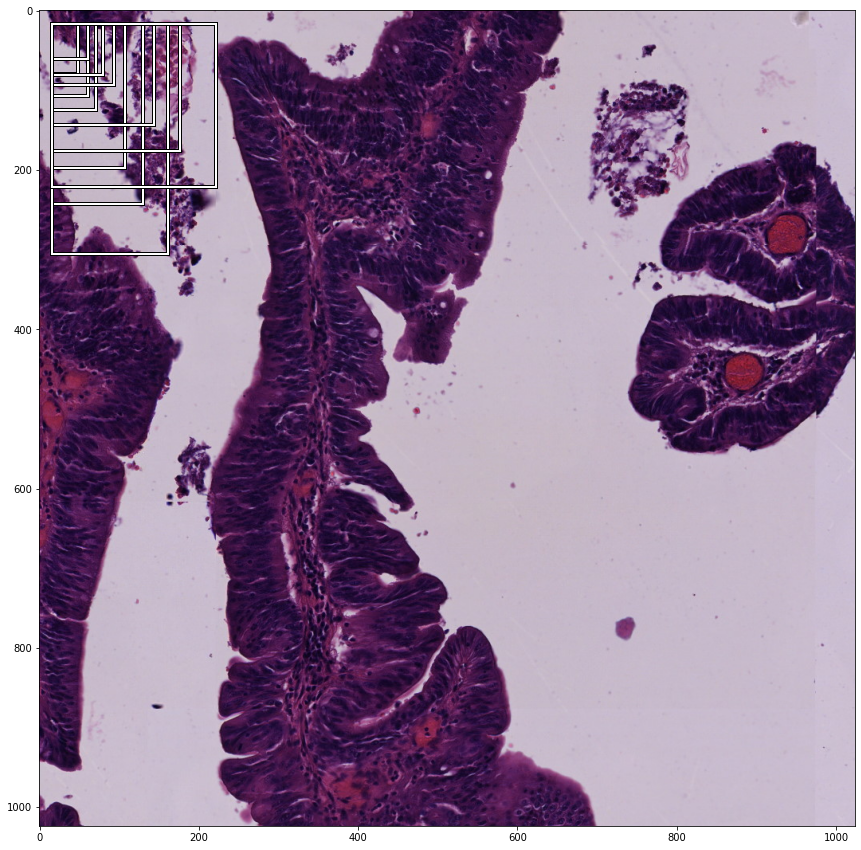

In [27]:
fig,ax = plt.subplots(figsize=(15,15))
ax.imshow(image2np(data.valid_ds[0][0].data))

for i, bbox in enumerate(anchors[:len(scales+ratios+sizes)]):
    bb = bbox.numpy()
    x = (bb[0] + 1) * size / 2 
    y = (bb[1] + 1) * size / 2 
    w = bb[2] * size / 2
    h = bb[3] * size / 2
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

In [28]:
#all_boxes, all_labels = show_anchors_on_images(data, anchors, figsize=(12, 12))

In [29]:
#del encoder
#del model
#del learn
#torch.cuda.empty_cache()

In [30]:
crit = RetinaNetFocalLoss(anchors)
encoder = create_body(models.resnet34, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=len(scales) * len(ratios), 
                  sizes=[32, 16, 8], #32, 16, 8
                  chs=128, final_bias=-4., n_conv=3)

In [31]:
voc = PascalVOCMetric(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]])
learn = Learner(data, model, loss_func=crit, 
                callback_fns=[BBMetrics, ShowGraph], #BBMetrics, ShowGraph
                metrics=[] # voc
               )

In [32]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

epoch,train_loss,valid_loss,BBloss,focal_loss,time
0,1.310609,1.148089,0.223127,0.924962,00:45


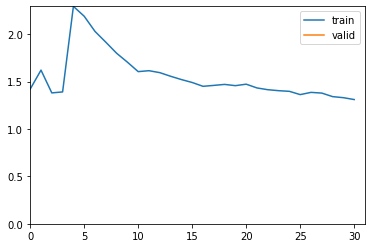

In [33]:
learn.fit_one_cycle(1, 1e-3)

epoch,train_loss,valid_loss,BBloss,focal_loss,time
0,1.108617,1.119298,0.214032,0.905266,00:40
1,1.077860,1.028090,0.212911,0.815179,00:37
2,1.070993,1.016261,0.208256,0.808004,00:34
3,1.045713,1.016176,0.222910,0.793265,00:35
4,1.030278,0.994183,0.205637,0.788546,00:36
5,1.011622,0.932921,0.199963,0.732958,00:36
6,0.972743,0.969413,0.204362,0.765051,00:34
7,0.923635,0.967496,0.199903,0.767593,00:34
8,0.918779,0.927087,0.193787,0.733301,00:35
9,0.910863,0.914818,0.187348,0.727470,00:35


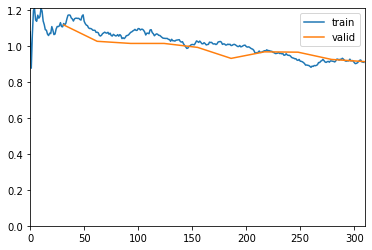

In [34]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-4)

epoch,train_loss,valid_loss,BBloss,focal_loss,time
0,0.876662,0.908995,0.191412,0.717583,00:39
1,0.892501,0.953591,0.197233,0.756358,00:39
2,0.876192,0.904548,0.187373,0.717175,00:39
3,0.869868,0.955822,0.200456,0.755366,00:38
4,0.856364,0.917908,0.195355,0.722553,00:40
5,0.868544,0.930595,0.195847,0.734748,00:40
6,0.855362,0.893012,0.186522,0.706490,00:40
7,0.831101,0.904441,0.191166,0.713275,00:37
8,0.823159,0.923722,0.186934,0.736789,00:34
9,0.818971,0.928447,0.190358,0.738089,00:34


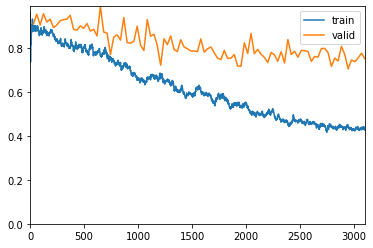

In [35]:
learn.fit_one_cycle(100, 1e-4)

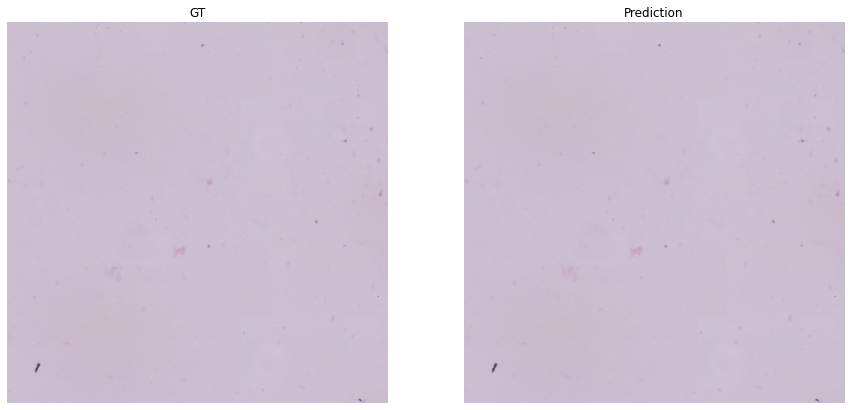

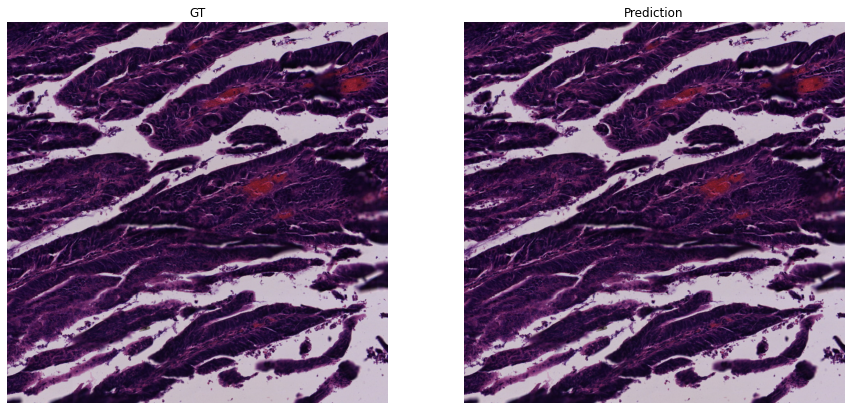

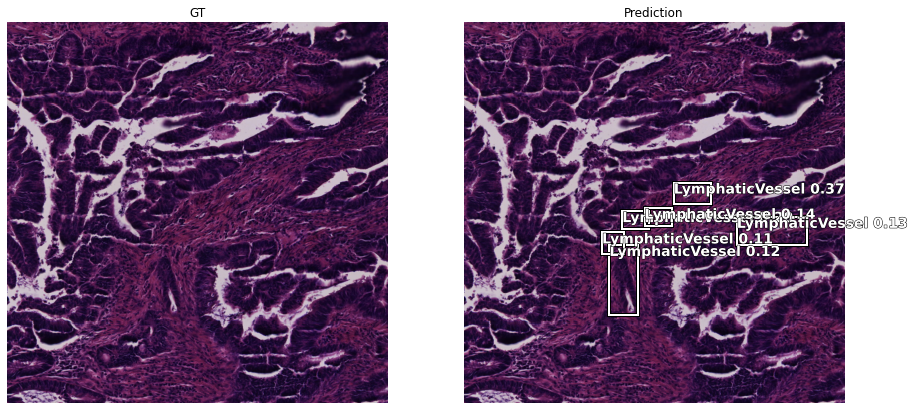

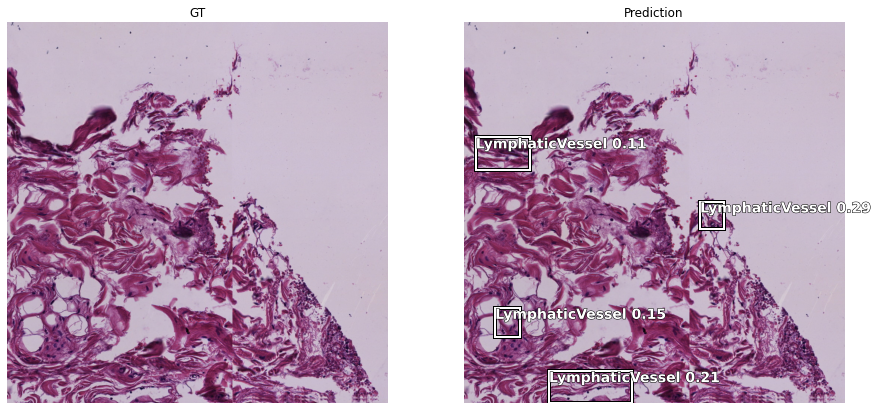

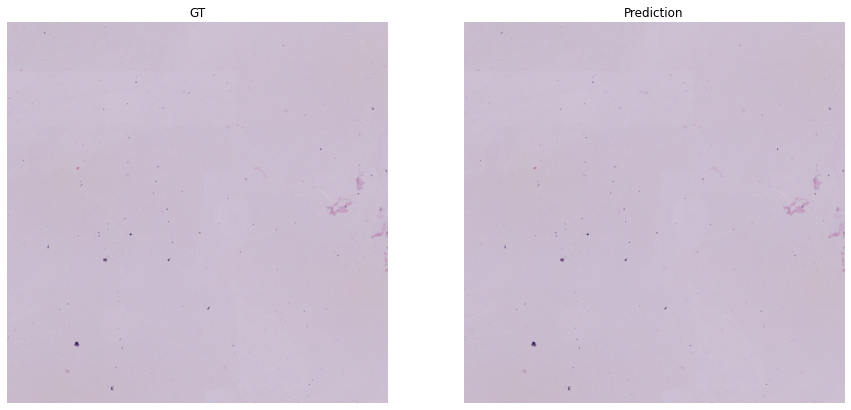

...

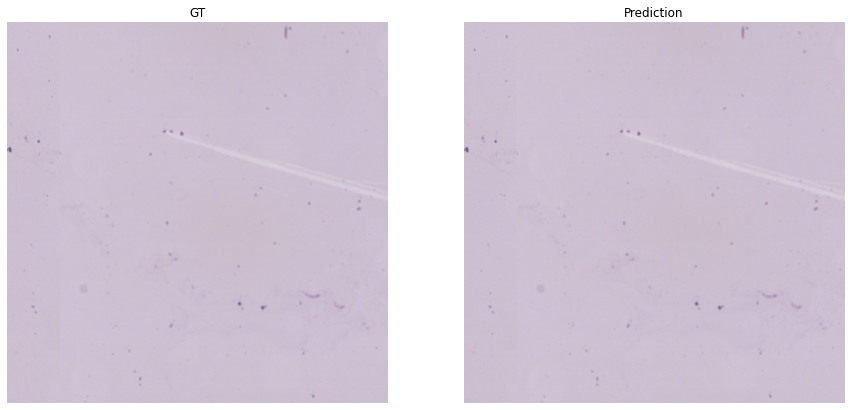

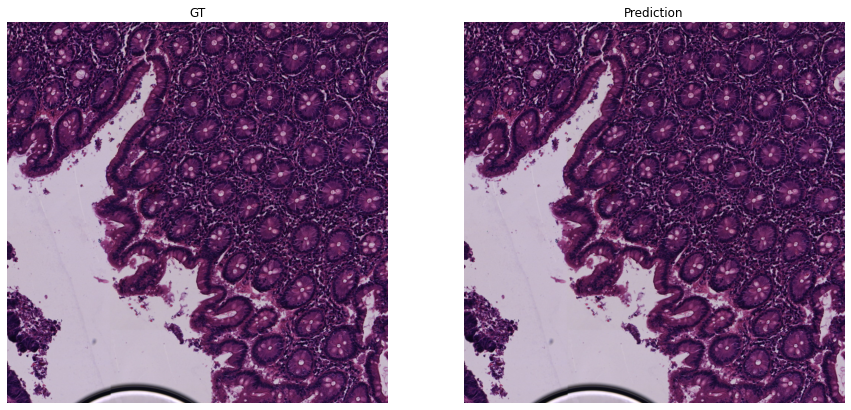

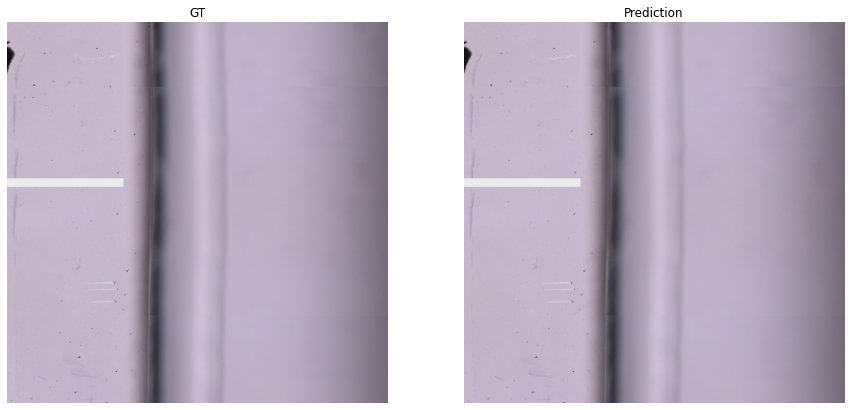

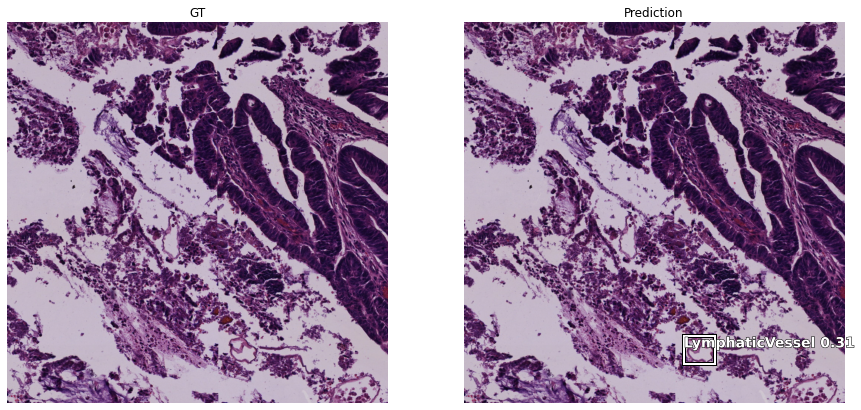

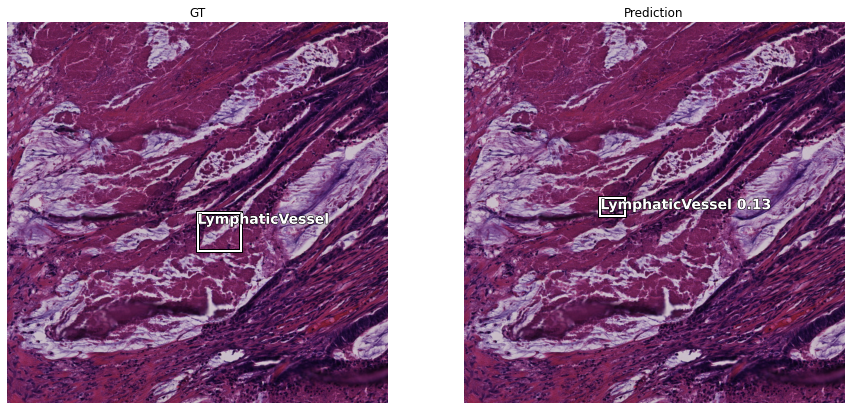

In [36]:
show_results_side_by_side(learn, anchors, detect_thresh=0.1, nms_thresh=0.1, image_count=15)

epoch,train_loss,valid_loss,BBloss,focal_loss,time
0,0.422063,0.744414,0.138189,0.606225,00:39
1,0.424035,0.753419,0.138205,0.615214,00:39
2,0.400655,0.822592,0.148137,0.674455,00:38
3,0.426200,0.751908,0.139947,0.611961,00:38
4,0.424534,0.759318,0.134086,0.625232,00:38
5,0.447411,0.805289,0.139108,0.666181,00:34
6,0.447813,0.753639,0.140148,0.613491,00:34
7,0.445761,0.784806,0.139351,0.645454,00:34
8,0.442791,0.739113,0.132554,0.606559,00:34
9,0.451940,0.725131,0.132633,0.592498,00:34


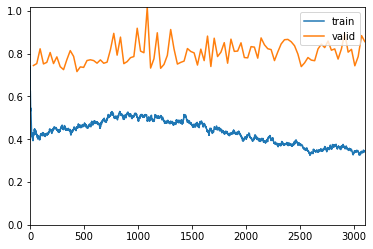

In [37]:
learn.fit_one_cycle(100, 1e-4)

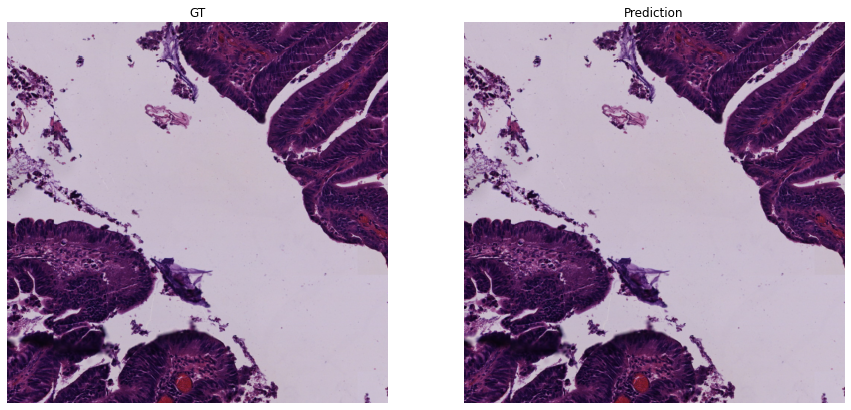

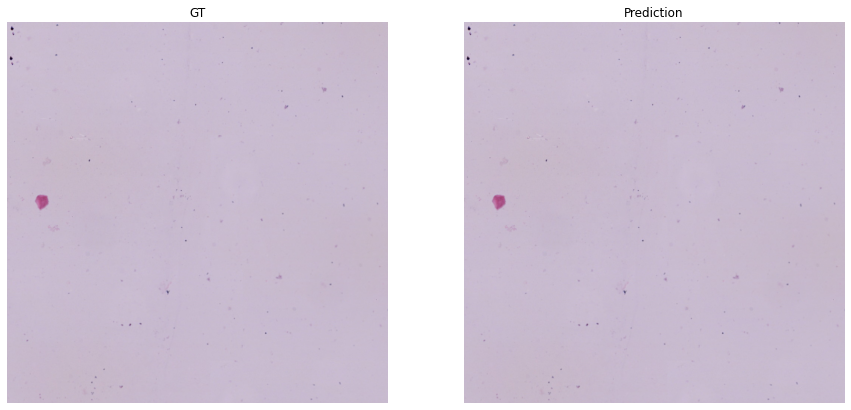

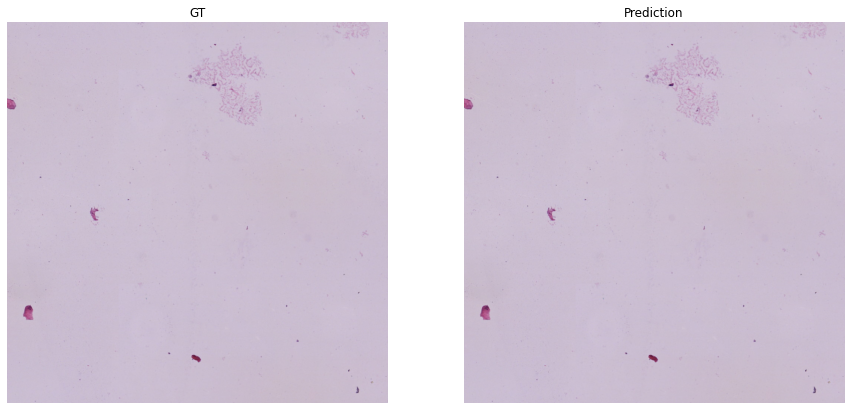

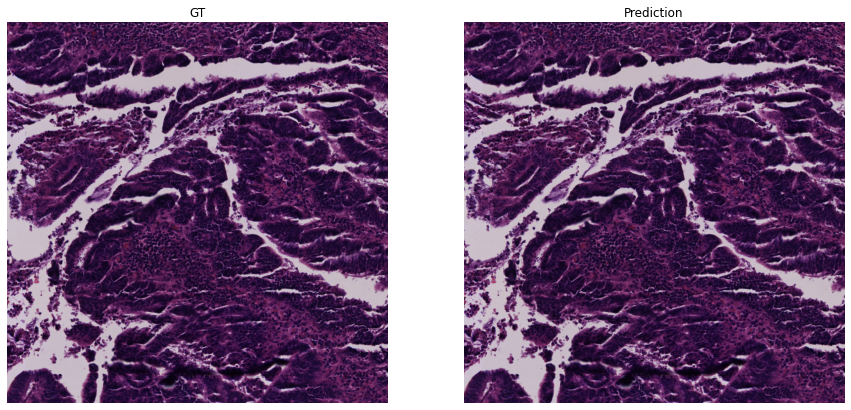

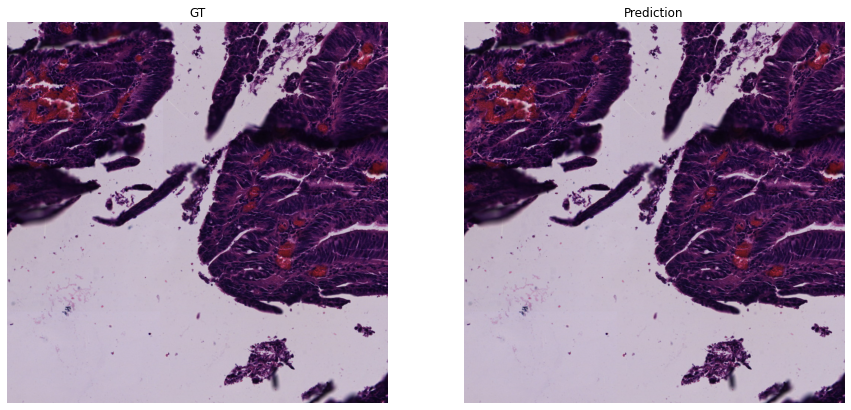

...

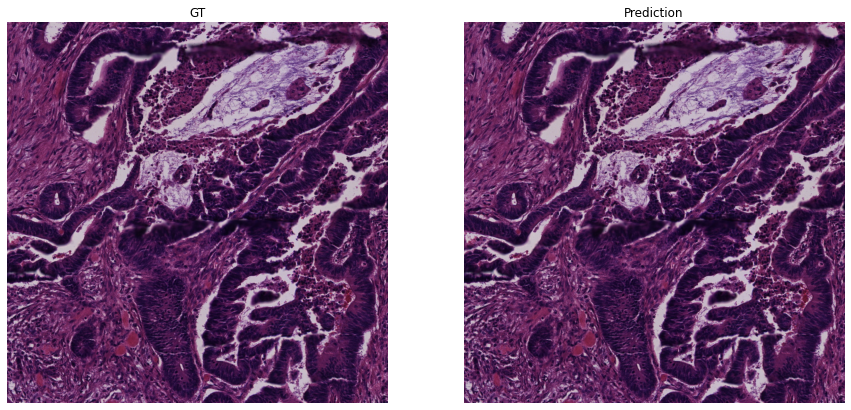

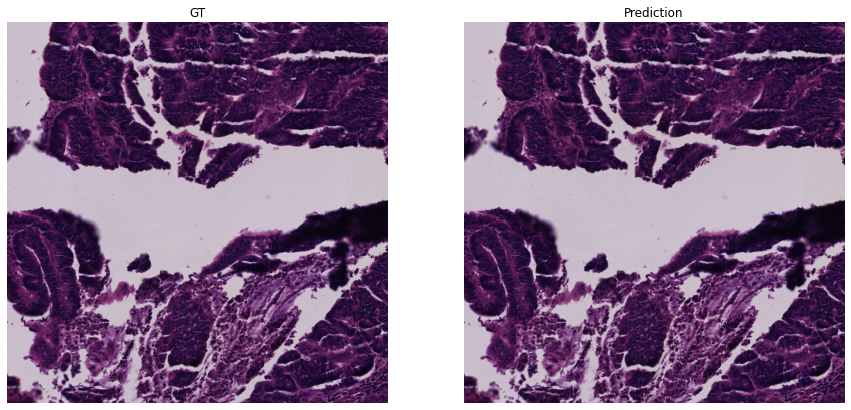

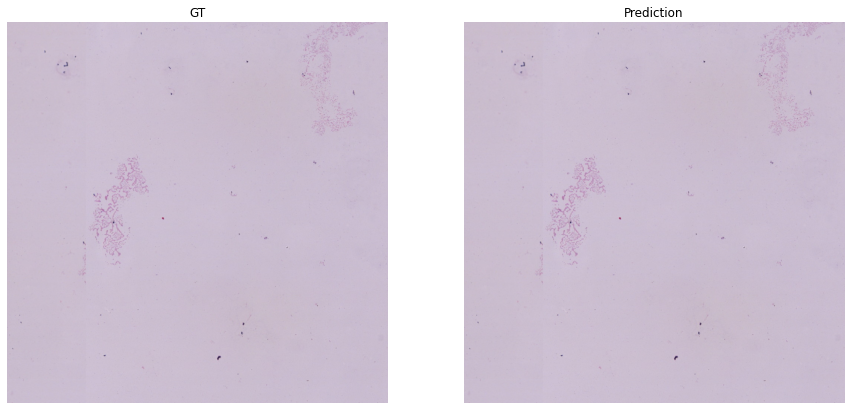

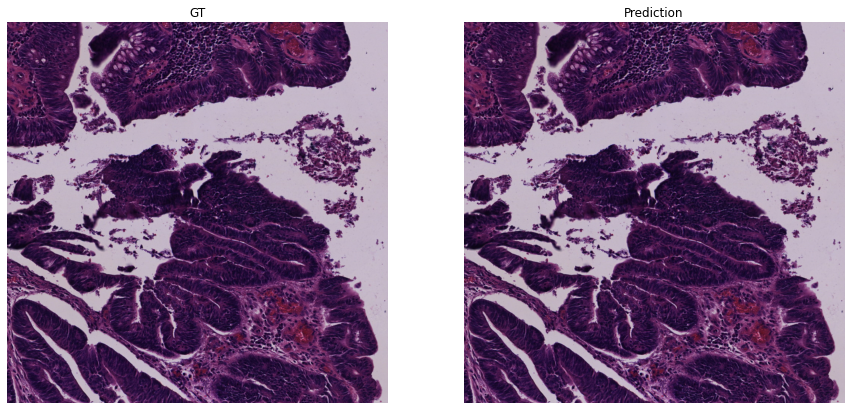

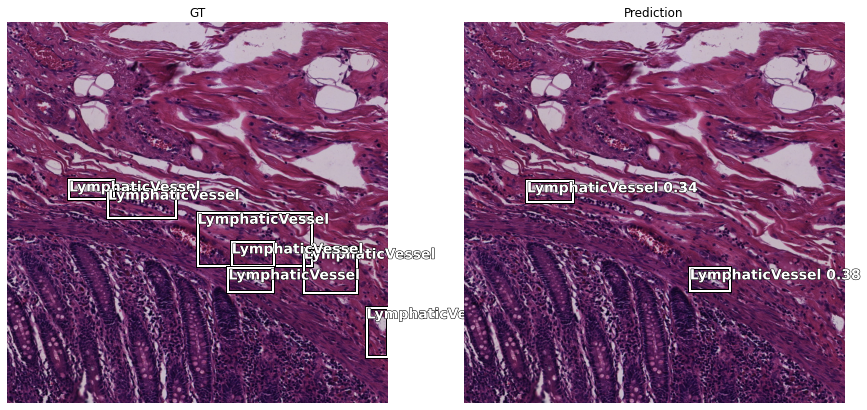

In [41]:
show_results_side_by_side(learn, anchors, detect_thresh=0.3, nms_thresh=0.1, image_count=15)